In [1]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, Subset
from transformers import ViTForImageClassification, ViTImageProcessor
from PIL import Image
from tqdm import tqdm

# Пути к данным
TRAIN_DATA_PATH = '/content/drive/MyDrive/no_bg/train_no_bg'
TEST_DATA_PATH = '/content/drive/MyDrive/no_bg/test_no_bg'

# Гиперпараметры
MODEL_NAME = 'google/vit-base-patch16-224-in21k'
BATCH_SIZE = 8
LEARNING_RATE = 1e-5
NUM_EPOCHS = 20
K_FOLDS = 5

# Устройство
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Процессор изображений и преобразования
processor = ViTImageProcessor.from_pretrained(MODEL_NAME)
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=processor.image_mean, std=processor.image_std),
])
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=processor.image_mean, std=processor.image_std),
])

# Класс для загрузки данных с путями
class CustomImageFolderWithPaths(datasets.ImageFolder):
    def __getitem__(self, index):
        image, label = super().__getitem__(index)
        path = self.imgs[index][0]  # Путь к изображению
        return image, label, path

# Датасеты
train_dataset = CustomImageFolderWithPaths(root=TRAIN_DATA_PATH, transform=train_transform)
test_dataset = CustomImageFolderWithPaths(root=TEST_DATA_PATH, transform=test_transform)

# Класс модели с поддержкой внимания
class ViTWithAttention(ViTForImageClassification):
    def forward(self, pixel_values, labels=None, output_attentions=False):
        outputs = super().forward(pixel_values=pixel_values, labels=labels)
        if output_attentions:
            attentions = outputs.attentions
            return outputs.logits, attentions
        else:
            return outputs.logits

class EarlyStopping:
    """
    Ранняя остановка для предотвращения переобучения.
    """
    def __init__(self, patience=3, delta=0, verbose=False):
        """
        :param patience: Сколько эпох ждать улучшения.
        :param delta: Минимальное изменение для улучшения.
        :param verbose: Выводить сообщения об остановке.
        """
        self.patience = patience
        self.delta = delta
        self.verbose = verbose
        self.best_score = None
        self.epochs_without_improvement = 0
        self.stop_training = False

    def __call__(self, val_loss):
        score = -val_loss
        if self.best_score is None or score > self.best_score + self.delta:
            self.best_score = score
            self.epochs_without_improvement = 0
        else:
            self.epochs_without_improvement += 1
            if self.verbose:
                print(f"EarlyStopping: No improvement for {self.epochs_without_improvement} epoch(s).")
            if self.epochs_without_improvement >= self.patience:
                self.stop_training = True


from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

def train_kfold_with_reports(model_class, dataset, num_epochs=2, k_folds=3, batch_size=32, learning_rate=1e-5, patience=3, save_dir="models"):
    """
    Обучение модели с K-Fold Cross-Validation, ранней остановкой, сохранением моделей и генерацией отчётов.
    """
    kfold = KFold(n_splits=k_folds, shuffle=True, random_state=42)
    results = {}

    # Создаем директорию для сохранения моделей
    os.makedirs(save_dir, exist_ok=True)

    for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
        print(f"\n--- Fold {fold + 1}/{k_folds} ---")

        # Инициализируем новую модель для каждого фолда
        model = model_class.from_pretrained(MODEL_NAME, output_attentions=True).to(DEVICE)

        # Создание тренировочного и валидационного наборов
        train_subsampler = Subset(dataset, train_idx)
        val_subsampler = Subset(dataset, val_idx)

        train_loader = DataLoader(train_subsampler, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_subsampler, batch_size=batch_size, shuffle=False)

        # Инициализация оптимизатора и функции потерь
        optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
        criterion = torch.nn.CrossEntropyLoss()

        # Инициализация ранней остановки
        early_stopping = EarlyStopping(patience=patience, verbose=True)

        for epoch in range(num_epochs):
            print(f"Epoch {epoch + 1}/{num_epochs}")
            model.train()
            running_loss = 0.0
            correct = 0
            total = 0

            for inputs, labels, _ in tqdm(train_loader, desc="Training"):
                inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
                optimizer.zero_grad()

                # Прогон через модель
                outputs = model(pixel_values=inputs, labels=labels)
                logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                loss = criterion(logits, labels)
                loss.backward()
                optimizer.step()

                running_loss += loss.item()

                # Подсчёт точности
                _, predicted = torch.max(logits, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

            epoch_loss = running_loss / len(train_loader)
            epoch_accuracy = 100 * correct / total
            print(f"Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.2f}%")

            # Оценка на валидационных данных
            val_loss, val_accuracy, val_report = evaluate_model_with_report(model, val_loader)
            print(f"Validation Loss: {val_loss:.4f}, Accuracy: {val_accuracy:.2f}%")
            print("Validation Report:")
            print(val_report)

            # Проверка ранней остановки
            early_stopping(val_loss)
            if early_stopping.stop_training:
                print("Early stopping triggered. Stopping training.")
                break

        # Сохраняем результаты для текущего фолда
        results[fold] = {'val_loss': val_loss, 'val_accuracy': val_accuracy, 'report': val_report}

        # Сохранение модели
        model_save_path = os.path.join(save_dir, f"model_fold_{fold + 1}.pth")
        torch.save(model.state_dict(), model_save_path)
        print(f"Model for fold {fold + 1} saved to {model_save_path}")

    return results


def evaluate_model_with_report(model, dataloader):
    """
    Оценка модели и генерация отчёта.
    """
    model.eval()
    correct, total, val_loss = 0, 0, 0.0
    criterion = torch.nn.CrossEntropyLoss()

    all_labels = []
    all_predictions = []

    # Извлекаем классы из исходного датасета
    original_dataset = dataloader.dataset.dataset  # Получаем оригинальный датасет из Subset
    classes = original_dataset.classes if hasattr(original_dataset, "classes") else []

    with torch.no_grad():
        for inputs, labels, _ in dataloader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            outputs = model(pixel_values=inputs, labels=labels)
            logits = outputs.logits if hasattr(outputs, 'logits') else outputs
            loss = criterion(logits, labels)
            val_loss += loss.item()

            _, predicted = torch.max(logits, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    avg_val_loss = val_loss / len(dataloader)
    accuracy = accuracy_score(all_labels, all_predictions)
    precision = precision_score(all_labels, all_predictions, average="weighted")
    recall = recall_score(all_labels, all_predictions, average="weighted")
    f1 = f1_score(all_labels, all_predictions, average="weighted")

    # Генерация отчёта
    report = classification_report(all_labels, all_predictions, target_names=classes)

    return avg_val_loss, accuracy, report

# Функция для визуализации масок внимания
def visualize_attention(image_path, model):
    model.eval()
    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=processor.image_mean, std=processor.image_std),
    ])
    input_tensor = transform(image).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        outputs = model(pixel_values=input_tensor, output_attentions=True)
        attentions = outputs.attentions

    # Выбираем последнюю матрицу внимания
    last_attention = attentions[-1][0]  # Batch size = 1, выбираем первый элемент
    num_heads = last_attention.shape[0]

    # Среднее по всем головам внимания
    avg_attention = last_attention.mean(dim=0).cpu().numpy()

    # Визуализация
    plt.figure(figsize=(10, 10))
    plt.imshow(avg_attention, cmap='viridis')
    plt.title("Attention Map")
    plt.axis("off")
    plt.show()


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

In [2]:
results = train_kfold_with_reports(
    ViTWithAttention,
    train_dataset,
    num_epochs=NUM_EPOCHS,
    k_folds=K_FOLDS,
    batch_size=BATCH_SIZE,
    learning_rate=LEARNING_RATE,
    patience=5,
    save_dir="saved_models"
)



--- Fold 1/5 ---


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/20


Training: 100%|██████████| 357/357 [33:09<00:00,  5.57s/it]


Loss: 0.3692, Accuracy: 85.08%
Validation Loss: 0.2245, Accuracy: 0.93%
Validation Report:
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       512
           1       0.93      0.83      0.88       202

    accuracy                           0.93       714
   macro avg       0.93      0.90      0.92       714
weighted avg       0.93      0.93      0.93       714

Epoch 2/20


Training: 100%|██████████| 357/357 [03:05<00:00,  1.93it/s]


Loss: 0.1637, Accuracy: 94.99%
Validation Loss: 0.1796, Accuracy: 0.94%
Validation Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       512
           1       0.91      0.90      0.90       202

    accuracy                           0.94       714
   macro avg       0.93      0.93      0.93       714
weighted avg       0.94      0.94      0.94       714

Epoch 3/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.92it/s]


Loss: 0.0984, Accuracy: 97.34%
Validation Loss: 0.1396, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       512
           1       0.92      0.93      0.92       202

    accuracy                           0.96       714
   macro avg       0.95      0.95      0.95       714
weighted avg       0.96      0.96      0.96       714

Epoch 4/20


Training: 100%|██████████| 357/357 [03:05<00:00,  1.92it/s]


Loss: 0.0678, Accuracy: 98.14%
Validation Loss: 0.1349, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       512
           1       0.94      0.92      0.93       202

    accuracy                           0.96       714
   macro avg       0.95      0.95      0.95       714
weighted avg       0.96      0.96      0.96       714

Epoch 5/20


Training: 100%|██████████| 357/357 [03:05<00:00,  1.92it/s]


Loss: 0.0481, Accuracy: 98.95%
Validation Loss: 0.1674, Accuracy: 0.95%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.97       512
           1       0.88      0.96      0.92       202

    accuracy                           0.95       714
   macro avg       0.93      0.95      0.94       714
weighted avg       0.95      0.95      0.95       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 6/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.92it/s]


Loss: 0.0544, Accuracy: 98.46%
Validation Loss: 0.1033, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       512
           1       0.94      0.94      0.94       202

    accuracy                           0.97       714
   macro avg       0.96      0.96      0.96       714
weighted avg       0.97      0.97      0.97       714

Epoch 7/20


Training: 100%|██████████| 357/357 [03:07<00:00,  1.91it/s]


Loss: 0.0267, Accuracy: 99.40%
Validation Loss: 0.1348, Accuracy: 0.95%
Validation Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       512
           1       0.97      0.84      0.90       202

    accuracy                           0.95       714
   macro avg       0.96      0.92      0.93       714
weighted avg       0.95      0.95      0.95       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 8/20


Training: 100%|██████████| 357/357 [03:05<00:00,  1.93it/s]


Loss: 0.0176, Accuracy: 99.61%
Validation Loss: 0.1169, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       512
           1       0.92      0.96      0.94       202

    accuracy                           0.96       714
   macro avg       0.95      0.96      0.96       714
weighted avg       0.96      0.96      0.96       714

EarlyStopping: No improvement for 2 epoch(s).
Epoch 9/20


Training: 100%|██████████| 357/357 [03:05<00:00,  1.92it/s]


Loss: 0.0366, Accuracy: 99.12%
Validation Loss: 0.1784, Accuracy: 0.94%
Validation Report:
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       512
           1       0.99      0.81      0.89       202

    accuracy                           0.94       714
   macro avg       0.96      0.90      0.93       714
weighted avg       0.95      0.94      0.94       714

EarlyStopping: No improvement for 3 epoch(s).
Epoch 10/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.91it/s]


Loss: 0.0338, Accuracy: 98.95%
Validation Loss: 0.1685, Accuracy: 0.95%
Validation Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       512
           1       0.99      0.83      0.90       202

    accuracy                           0.95       714
   macro avg       0.96      0.91      0.93       714
weighted avg       0.95      0.95      0.95       714

EarlyStopping: No improvement for 4 epoch(s).
Epoch 11/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.92it/s]


Loss: 0.0173, Accuracy: 99.44%
Validation Loss: 0.1138, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       512
           1       0.97      0.92      0.94       202

    accuracy                           0.97       714
   macro avg       0.97      0.95      0.96       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 5 epoch(s).
Early stopping triggered. Stopping training.
Model for fold 1 saved to saved_models/model_fold_1.pth

--- Fold 2/5 ---


Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.92it/s]


Loss: 0.3703, Accuracy: 83.96%
Validation Loss: 0.2314, Accuracy: 0.90%
Validation Report:
              precision    recall  f1-score   support

           0       0.91      0.96      0.93       505
           1       0.88      0.78      0.82       209

    accuracy                           0.90       714
   macro avg       0.90      0.87      0.88       714
weighted avg       0.90      0.90      0.90       714

Epoch 2/20


Training: 100%|██████████| 357/357 [03:07<00:00,  1.91it/s]


Loss: 0.1875, Accuracy: 93.91%
Validation Loss: 0.1717, Accuracy: 0.94%
Validation Report:
              precision    recall  f1-score   support

           0       0.93      0.99      0.96       505
           1       0.97      0.82      0.89       209

    accuracy                           0.94       714
   macro avg       0.95      0.90      0.92       714
weighted avg       0.94      0.94      0.94       714

Epoch 3/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.1190, Accuracy: 96.46%
Validation Loss: 0.1325, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       505
           1       0.99      0.86      0.92       209

    accuracy                           0.96       714
   macro avg       0.97      0.93      0.95       714
weighted avg       0.96      0.96      0.96       714

Epoch 4/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0768, Accuracy: 97.83%
Validation Loss: 0.1329, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       505
           1       0.90      0.95      0.93       209

    accuracy                           0.96       714
   macro avg       0.94      0.95      0.95       714
weighted avg       0.96      0.96      0.96       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 5/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0470, Accuracy: 98.84%
Validation Loss: 0.0855, Accuracy: 0.98%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       505
           1       0.98      0.95      0.96       209

    accuracy                           0.98       714
   macro avg       0.98      0.97      0.97       714
weighted avg       0.98      0.98      0.98       714

Epoch 6/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0407, Accuracy: 98.67%
Validation Loss: 0.0891, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       505
           1       0.98      0.94      0.96       209

    accuracy                           0.97       714
   macro avg       0.97      0.96      0.97       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 7/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0347, Accuracy: 98.88%
Validation Loss: 0.0960, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       505
           1       0.96      0.93      0.94       209

    accuracy                           0.97       714
   macro avg       0.97      0.96      0.96       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 2 epoch(s).
Epoch 8/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0493, Accuracy: 98.25%
Validation Loss: 0.0837, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       505
           1       0.94      0.97      0.96       209

    accuracy                           0.97       714
   macro avg       0.97      0.97      0.97       714
weighted avg       0.98      0.97      0.97       714

Epoch 9/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0230, Accuracy: 99.37%
Validation Loss: 0.1133, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       505
           1       0.98      0.91      0.95       209

    accuracy                           0.97       714
   macro avg       0.97      0.95      0.96       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 10/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0148, Accuracy: 99.79%
Validation Loss: 0.1134, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.99      0.96      0.97       505
           1       0.91      0.98      0.94       209

    accuracy                           0.96       714
   macro avg       0.95      0.97      0.96       714
weighted avg       0.97      0.96      0.97       714

EarlyStopping: No improvement for 2 epoch(s).
Epoch 11/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0068, Accuracy: 100.00%
Validation Loss: 0.0893, Accuracy: 0.98%
Validation Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       505
           1       0.97      0.97      0.97       209

    accuracy                           0.98       714
   macro avg       0.98      0.98      0.98       714
weighted avg       0.98      0.98      0.98       714

EarlyStopping: No improvement for 3 epoch(s).
Epoch 12/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0044, Accuracy: 100.00%
Validation Loss: 0.1070, Accuracy: 0.98%
Validation Report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       505
           1       0.95      0.97      0.96       209

    accuracy                           0.98       714
   macro avg       0.97      0.97      0.97       714
weighted avg       0.98      0.98      0.98       714

EarlyStopping: No improvement for 4 epoch(s).
Epoch 13/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0033, Accuracy: 100.00%
Validation Loss: 0.1023, Accuracy: 0.98%
Validation Report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       505
           1       0.96      0.97      0.96       209

    accuracy                           0.98       714
   macro avg       0.97      0.97      0.97       714
weighted avg       0.98      0.98      0.98       714

EarlyStopping: No improvement for 5 epoch(s).
Early stopping triggered. Stopping training.
Model for fold 2 saved to saved_models/model_fold_2.pth

--- Fold 3/5 ---


Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/20


Training: 100%|██████████| 357/357 [03:09<00:00,  1.88it/s]


Loss: 0.3520, Accuracy: 85.99%
Validation Loss: 0.1943, Accuracy: 0.94%
Validation Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.96       517
           1       0.92      0.85      0.88       197

    accuracy                           0.94       714
   macro avg       0.93      0.91      0.92       714
weighted avg       0.94      0.94      0.94       714

Epoch 2/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.1774, Accuracy: 94.36%
Validation Loss: 0.1884, Accuracy: 0.93%
Validation Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.95       517
           1       0.90      0.84      0.87       197

    accuracy                           0.93       714
   macro avg       0.92      0.90      0.91       714
weighted avg       0.93      0.93      0.93       714

Epoch 3/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.1103, Accuracy: 96.95%
Validation Loss: 0.1137, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       517
           1       0.98      0.88      0.93       197

    accuracy                           0.96       714
   macro avg       0.97      0.94      0.95       714
weighted avg       0.96      0.96      0.96       714

Epoch 4/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0801, Accuracy: 97.58%
Validation Loss: 0.1577, Accuracy: 0.94%
Validation Report:
              precision    recall  f1-score   support

           0       0.99      0.93      0.96       517
           1       0.83      0.96      0.89       197

    accuracy                           0.94       714
   macro avg       0.91      0.95      0.92       714
weighted avg       0.94      0.94      0.94       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 5/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.90it/s]


Loss: 0.0660, Accuracy: 98.00%
Validation Loss: 0.1106, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       517
           1       0.96      0.90      0.93       197

    accuracy                           0.96       714
   macro avg       0.96      0.94      0.95       714
weighted avg       0.96      0.96      0.96       714

Epoch 6/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0379, Accuracy: 98.81%
Validation Loss: 0.0901, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       517
           1       0.95      0.92      0.94       197

    accuracy                           0.96       714
   macro avg       0.96      0.95      0.96       714
weighted avg       0.96      0.96      0.96       714

Epoch 7/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0420, Accuracy: 98.70%
Validation Loss: 0.2247, Accuracy: 0.93%
Validation Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95       517
           1       0.99      0.75      0.86       197

    accuracy                           0.93       714
   macro avg       0.95      0.87      0.90       714
weighted avg       0.94      0.93      0.93       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 8/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0266, Accuracy: 99.26%
Validation Loss: 0.0963, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       517
           1       0.98      0.91      0.94       197

    accuracy                           0.97       714
   macro avg       0.97      0.95      0.96       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 2 epoch(s).
Epoch 9/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0184, Accuracy: 99.47%
Validation Loss: 0.1253, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       517
           1       0.92      0.94      0.93       197

    accuracy                           0.96       714
   macro avg       0.95      0.95      0.95       714
weighted avg       0.96      0.96      0.96       714

EarlyStopping: No improvement for 3 epoch(s).
Epoch 10/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0135, Accuracy: 99.72%
Validation Loss: 0.0812, Accuracy: 0.98%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       517
           1       0.97      0.95      0.96       197

    accuracy                           0.98       714
   macro avg       0.98      0.97      0.97       714
weighted avg       0.98      0.98      0.98       714

Epoch 11/20


Training: 100%|██████████| 357/357 [03:09<00:00,  1.89it/s]


Loss: 0.0125, Accuracy: 99.75%
Validation Loss: 0.1140, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       517
           1       0.91      0.95      0.93       197

    accuracy                           0.96       714
   macro avg       0.95      0.96      0.95       714
weighted avg       0.96      0.96      0.96       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 12/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0271, Accuracy: 99.19%
Validation Loss: 0.0688, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       517
           1       0.95      0.96      0.95       197

    accuracy                           0.97       714
   macro avg       0.97      0.97      0.97       714
weighted avg       0.97      0.97      0.97       714

Epoch 13/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0055, Accuracy: 99.89%
Validation Loss: 0.0704, Accuracy: 0.98%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       517
           1       0.97      0.95      0.96       197

    accuracy                           0.98       714
   macro avg       0.98      0.97      0.97       714
weighted avg       0.98      0.98      0.98       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 14/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.89it/s]


Loss: 0.0069, Accuracy: 99.82%
Validation Loss: 0.0878, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       517
           1       0.95      0.95      0.95       197

    accuracy                           0.97       714
   macro avg       0.97      0.97      0.97       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 2 epoch(s).
Epoch 15/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.90it/s]


Loss: 0.0087, Accuracy: 99.82%
Validation Loss: 0.1169, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98       517
           1       0.93      0.96      0.95       197

    accuracy                           0.97       714
   macro avg       0.96      0.97      0.96       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 3 epoch(s).
Epoch 16/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.91it/s]


Loss: 0.0118, Accuracy: 99.68%
Validation Loss: 0.1297, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       517
           1       0.97      0.90      0.93       197

    accuracy                           0.96       714
   macro avg       0.97      0.94      0.96       714
weighted avg       0.97      0.96      0.96       714

EarlyStopping: No improvement for 4 epoch(s).
Epoch 17/20


Training: 100%|██████████| 357/357 [03:05<00:00,  1.92it/s]


Loss: 0.0147, Accuracy: 99.61%
Validation Loss: 0.0815, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       517
           1       0.98      0.92      0.95       197

    accuracy                           0.97       714
   macro avg       0.98      0.96      0.97       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 5 epoch(s).
Early stopping triggered. Stopping training.
Model for fold 3 saved to saved_models/model_fold_3.pth

--- Fold 4/5 ---


Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.91it/s]


Loss: 0.3532, Accuracy: 85.85%
Validation Loss: 0.3087, Accuracy: 0.88%
Validation Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92       512
           1       0.99      0.57      0.72       202

    accuracy                           0.88       714
   macro avg       0.92      0.78      0.82       714
weighted avg       0.89      0.88      0.86       714

Epoch 2/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.91it/s]


Loss: 0.1780, Accuracy: 94.36%
Validation Loss: 0.1320, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       512
           1       0.94      0.91      0.92       202

    accuracy                           0.96       714
   macro avg       0.95      0.94      0.95       714
weighted avg       0.96      0.96      0.96       714

Epoch 3/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.91it/s]


Loss: 0.1069, Accuracy: 96.95%
Validation Loss: 0.1023, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       512
           1       0.96      0.92      0.94       202

    accuracy                           0.96       714
   macro avg       0.96      0.95      0.96       714
weighted avg       0.96      0.96      0.96       714

Epoch 4/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.91it/s]


Loss: 0.0773, Accuracy: 98.04%
Validation Loss: 0.1013, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       512
           1       0.97      0.92      0.94       202

    accuracy                           0.97       714
   macro avg       0.97      0.95      0.96       714
weighted avg       0.97      0.97      0.97       714

Epoch 5/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.91it/s]


Loss: 0.0638, Accuracy: 98.14%
Validation Loss: 0.1142, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.99      0.95      0.97       512
           1       0.89      0.97      0.93       202

    accuracy                           0.96       714
   macro avg       0.94      0.96      0.95       714
weighted avg       0.96      0.96      0.96       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 6/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.92it/s]


Loss: 0.0423, Accuracy: 99.02%
Validation Loss: 0.0810, Accuracy: 0.98%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       512
           1       0.98      0.94      0.96       202

    accuracy                           0.98       714
   macro avg       0.98      0.96      0.97       714
weighted avg       0.98      0.98      0.98       714

Epoch 7/20


Training: 100%|██████████| 357/357 [03:04<00:00,  1.93it/s]


Loss: 0.0431, Accuracy: 98.67%
Validation Loss: 0.2175, Accuracy: 0.93%
Validation Report:
              precision    recall  f1-score   support

           0       0.99      0.91      0.95       512
           1       0.80      0.98      0.88       202

    accuracy                           0.93       714
   macro avg       0.90      0.94      0.92       714
weighted avg       0.94      0.93      0.93       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 8/20


Training: 100%|██████████| 357/357 [03:05<00:00,  1.92it/s]


Loss: 0.0333, Accuracy: 98.91%
Validation Loss: 0.0760, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       512
           1       0.96      0.95      0.96       202

    accuracy                           0.97       714
   macro avg       0.97      0.97      0.97       714
weighted avg       0.97      0.97      0.97       714

Epoch 9/20


Training: 100%|██████████| 357/357 [03:05<00:00,  1.93it/s]


Loss: 0.0145, Accuracy: 99.75%
Validation Loss: 0.0773, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       512
           1       0.94      0.96      0.95       202

    accuracy                           0.97       714
   macro avg       0.96      0.97      0.97       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 10/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.91it/s]


Loss: 0.0169, Accuracy: 99.72%
Validation Loss: 0.1187, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       512
           1       0.99      0.89      0.94       202

    accuracy                           0.97       714
   macro avg       0.98      0.94      0.96       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 2 epoch(s).
Epoch 11/20


Training: 100%|██████████| 357/357 [03:08<00:00,  1.90it/s]


Loss: 0.0181, Accuracy: 99.54%
Validation Loss: 0.0781, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       512
           1       0.96      0.95      0.95       202

    accuracy                           0.97       714
   macro avg       0.97      0.97      0.97       714
weighted avg       0.97      0.97      0.97       714

EarlyStopping: No improvement for 3 epoch(s).
Epoch 12/20


Training: 100%|██████████| 357/357 [03:04<00:00,  1.93it/s]


Loss: 0.0183, Accuracy: 99.47%
Validation Loss: 0.0772, Accuracy: 0.98%
Validation Report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       512
           1       0.94      0.98      0.96       202

    accuracy                           0.98       714
   macro avg       0.97      0.98      0.97       714
weighted avg       0.98      0.98      0.98       714

EarlyStopping: No improvement for 4 epoch(s).
Epoch 13/20


Training: 100%|██████████| 357/357 [03:05<00:00,  1.92it/s]


Loss: 0.0151, Accuracy: 99.58%
Validation Loss: 0.1873, Accuracy: 0.94%
Validation Report:
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       512
           1       1.00      0.80      0.89       202

    accuracy                           0.94       714
   macro avg       0.96      0.90      0.92       714
weighted avg       0.95      0.94      0.94       714

EarlyStopping: No improvement for 5 epoch(s).
Early stopping triggered. Stopping training.
Model for fold 4 saved to saved_models/model_fold_4.pth

--- Fold 5/5 ---


Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/20


Training: 100%|██████████| 357/357 [03:04<00:00,  1.93it/s]


Loss: 0.3561, Accuracy: 85.68%
Validation Loss: 0.2572, Accuracy: 0.92%
Validation Report:
              precision    recall  f1-score   support

           0       0.93      0.96      0.94       487
           1       0.90      0.84      0.87       227

    accuracy                           0.92       714
   macro avg       0.91      0.90      0.90       714
weighted avg       0.92      0.92      0.92       714

Epoch 2/20


Training: 100%|██████████| 357/357 [03:03<00:00,  1.94it/s]


Loss: 0.1705, Accuracy: 94.85%
Validation Loss: 0.2087, Accuracy: 0.93%
Validation Report:
              precision    recall  f1-score   support

           0       0.91      0.99      0.95       487
           1       0.97      0.79      0.87       227

    accuracy                           0.93       714
   macro avg       0.94      0.89      0.91       714
weighted avg       0.93      0.93      0.92       714

Epoch 3/20


Training: 100%|██████████| 357/357 [03:04<00:00,  1.94it/s]


Loss: 0.1044, Accuracy: 97.23%
Validation Loss: 0.1742, Accuracy: 0.94%
Validation Report:
              precision    recall  f1-score   support

           0       0.93      0.99      0.96       487
           1       0.97      0.84      0.90       227

    accuracy                           0.94       714
   macro avg       0.95      0.91      0.93       714
weighted avg       0.94      0.94      0.94       714

Epoch 4/20


Training: 100%|██████████| 357/357 [03:06<00:00,  1.92it/s]


Loss: 0.0881, Accuracy: 97.37%
Validation Loss: 0.1491, Accuracy: 0.95%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       487
           1       0.93      0.93      0.93       227

    accuracy                           0.95       714
   macro avg       0.95      0.95      0.95       714
weighted avg       0.95      0.95      0.95       714

Epoch 5/20


Training: 100%|██████████| 357/357 [03:07<00:00,  1.91it/s]


Loss: 0.0597, Accuracy: 98.42%
Validation Loss: 0.1463, Accuracy: 0.95%
Validation Report:
              precision    recall  f1-score   support

           0       0.97      0.96      0.96       487
           1       0.92      0.93      0.93       227

    accuracy                           0.95       714
   macro avg       0.94      0.95      0.95       714
weighted avg       0.95      0.95      0.95       714

Epoch 6/20


Training: 100%|██████████| 357/357 [03:03<00:00,  1.94it/s]


Loss: 0.0460, Accuracy: 98.88%
Validation Loss: 0.1467, Accuracy: 0.95%
Validation Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.96       487
           1       0.96      0.88      0.92       227

    accuracy                           0.95       714
   macro avg       0.95      0.93      0.94       714
weighted avg       0.95      0.95      0.95       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 7/20


Training: 100%|██████████| 357/357 [03:05<00:00,  1.93it/s]


Loss: 0.0360, Accuracy: 99.09%
Validation Loss: 0.1654, Accuracy: 0.95%
Validation Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       487
           1       0.97      0.86      0.91       227

    accuracy                           0.95       714
   macro avg       0.96      0.92      0.94       714
weighted avg       0.95      0.95      0.95       714

EarlyStopping: No improvement for 2 epoch(s).
Epoch 8/20


Training: 100%|██████████| 357/357 [03:04<00:00,  1.93it/s]


Loss: 0.0219, Accuracy: 99.33%
Validation Loss: 0.1193, Accuracy: 0.97%
Validation Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       487
           1       0.98      0.92      0.95       227

    accuracy                           0.97       714
   macro avg       0.97      0.96      0.96       714
weighted avg       0.97      0.97      0.97       714

Epoch 9/20


Training: 100%|██████████| 357/357 [03:04<00:00,  1.94it/s]


Loss: 0.0291, Accuracy: 98.91%
Validation Loss: 0.2410, Accuracy: 0.93%
Validation Report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95       487
           1       0.96      0.82      0.89       227

    accuracy                           0.93       714
   macro avg       0.94      0.90      0.92       714
weighted avg       0.93      0.93      0.93       714

EarlyStopping: No improvement for 1 epoch(s).
Epoch 10/20


Training: 100%|██████████| 357/357 [03:04<00:00,  1.93it/s]


Loss: 0.0278, Accuracy: 98.88%
Validation Loss: 0.2219, Accuracy: 0.94%
Validation Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       487
           1       0.99      0.82      0.90       227

    accuracy                           0.94       714
   macro avg       0.96      0.91      0.93       714
weighted avg       0.94      0.94      0.94       714

EarlyStopping: No improvement for 2 epoch(s).
Epoch 11/20


Training: 100%|██████████| 357/357 [03:04<00:00,  1.93it/s]


Loss: 0.0176, Accuracy: 99.44%
Validation Loss: 0.1651, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.97       487
           1       0.94      0.92      0.93       227

    accuracy                           0.96       714
   macro avg       0.95      0.94      0.95       714
weighted avg       0.96      0.96      0.96       714

EarlyStopping: No improvement for 3 epoch(s).
Epoch 12/20


Training: 100%|██████████| 357/357 [03:07<00:00,  1.90it/s]


Loss: 0.0240, Accuracy: 99.37%
Validation Loss: 0.1418, Accuracy: 0.96%
Validation Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       487
           1       0.96      0.92      0.94       227

    accuracy                           0.96       714
   macro avg       0.96      0.95      0.95       714
weighted avg       0.96      0.96      0.96       714

EarlyStopping: No improvement for 4 epoch(s).
Epoch 13/20


Training: 100%|██████████| 357/357 [03:07<00:00,  1.90it/s]


Loss: 0.0066, Accuracy: 99.96%
Validation Loss: 0.1813, Accuracy: 0.95%
Validation Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       487
           1       0.98      0.87      0.92       227

    accuracy                           0.95       714
   macro avg       0.96      0.93      0.94       714
weighted avg       0.95      0.95      0.95       714

EarlyStopping: No improvement for 5 epoch(s).
Early stopping triggered. Stopping training.
Model for fold 5 saved to saved_models/model_fold_5.pth


In [ ]:
# import os

# # Указываем папку для сохранения модели
# output_dir = "/content/drive/MyDrive/2_semestr"

# # Создаем директорию, если она еще не создана
# os.makedirs(output_dir, exist_ok=True)

# # Сохраняем модель
# model.save_pretrained(output_dir)

# # Сохраняем процессор (ViTImageProcessor)
# processor.save_pretrained(output_dir)

# print(f"Model and processor saved to {output_dir}")


In [3]:
import pandas as pd

def predict_and_create_dataframe(model, dataloader, class_names):
    """
    Делает предсказания на данных и создает DataFrame с результатами.

    :param model: Обученная модель.
    :param dataloader: DataLoader для тестовых данных.
    :param class_names: Список имен классов.
    :return: DataFrame с именами файлов, предсказаниями и истинными значениями.
    """
    model.eval()
    predictions = []
    ground_truths = []
    file_names = []

    with torch.no_grad():
        for inputs, labels, paths in tqdm(dataloader, desc="Predicting"):
            inputs = inputs.to(DEVICE)
            labels = labels.to(DEVICE)

            # Получение предсказаний
            outputs = model(pixel_values=inputs)
            logits = outputs.logits if hasattr(outputs, 'logits') else outputs  # Проверяем наличие logits
            _, preds = torch.max(logits, 1)

            # Сохранение данных
            predictions.extend(preds.cpu().numpy())
            ground_truths.extend(labels.cpu().numpy())
            file_names.extend(paths)

    # Создание DataFrame
    df = pd.DataFrame({
        'File Name': file_names,
        'True Label': [class_names[label] for label in ground_truths],
        'Predicted Label': [class_names[pred] for pred in predictions]
    })

    return df


In [6]:
import torch
from torch.utils.data import DataLoader
import pandas as pd

# Загрузка модели
def load_model(model_path, model_class):
    """
    Загружает модель из указанного пути.
    """
    model = model_class.from_pretrained(MODEL_NAME, output_attentions=False)
    model.load_state_dict(torch.load(model_path))
    model.to(DEVICE)
    model.eval()
    return model

# Функция для предсказаний и создания DataFrame
def predict_and_create_dataframe(model, data_loader, class_names):
    """
    Делает предсказания для тестового набора и создает DataFrame.
    """
    all_predictions = []
    all_targets = []
    all_paths = []

    with torch.no_grad():
        for inputs, labels, paths in data_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            outputs = model(pixel_values=inputs)
            logits = outputs.logits if hasattr(outputs, 'logits') else outputs
            _, preds = torch.max(logits, 1)

            all_predictions.extend(preds.cpu().numpy())
            all_targets.extend(labels.cpu().numpy())
            all_paths.extend(paths)

    df = pd.DataFrame({
        "Image_Path": all_paths,
        "True_Label": [class_names[label] for label in all_targets],
        "Predicted_Label": [class_names[pred] for pred in all_predictions]
    })
    return df

# Оценка всех моделей
BATCH_SIZE = 32  # Размер пакета для тестовой загрузки
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)
class_names = train_dataset.classes

# Оцениваем все модели
for fold in range(1, 6):  # Для 5 моделей
    model_path = f"/content/saved_models/model_fold_{fold}.pth"
    print(f"Evaluating model: {model_path}")

    # Загружаем модель
    model = load_model(model_path, ViTWithAttention)

    # Предсказания и создание DataFrame
    df_results = predict_and_create_dataframe(model, test_loader, class_names)

    # Сохраняем результаты
    output_file = f"predictions_results_fold_{fold}.csv"
    df_results.to_csv(output_file, index=False)
    print(f"Results saved to {output_file}")


Evaluating model: /content/saved_models/model_fold_1.pth


Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
<ipython-input-6-64e1a7b16a83>:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We r

Results saved to predictions_results_fold_1.csv
Evaluating model: /content/saved_models/model_fold_2.pth


Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Results saved to predictions_results_fold_2.csv
Evaluating model: /content/saved_models/model_fold_3.pth


Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Results saved to predictions_results_fold_3.csv
Evaluating model: /content/saved_models/model_fold_4.pth


Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Results saved to predictions_results_fold_4.csv
Evaluating model: /content/saved_models/model_fold_5.pth


Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Results saved to predictions_results_fold_5.csv



--- Results from predictions_results_fold_1.csv ---

                                          Image_Path  True_Label  \
0  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
1  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
2  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
3  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
4  /content/drive/MyDrive/no_bg/test_no_bg/0/032_...           0   

   Predicted_Label  
0                0  
1                0  
2                0  
3                0  
4                0  

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       646
           1       0.98      0.91      0.95       246

    accuracy                           0.97       892
   macro avg       0.98      0.95      0.96       892
weighted avg       0.97      0.97      0.97       892



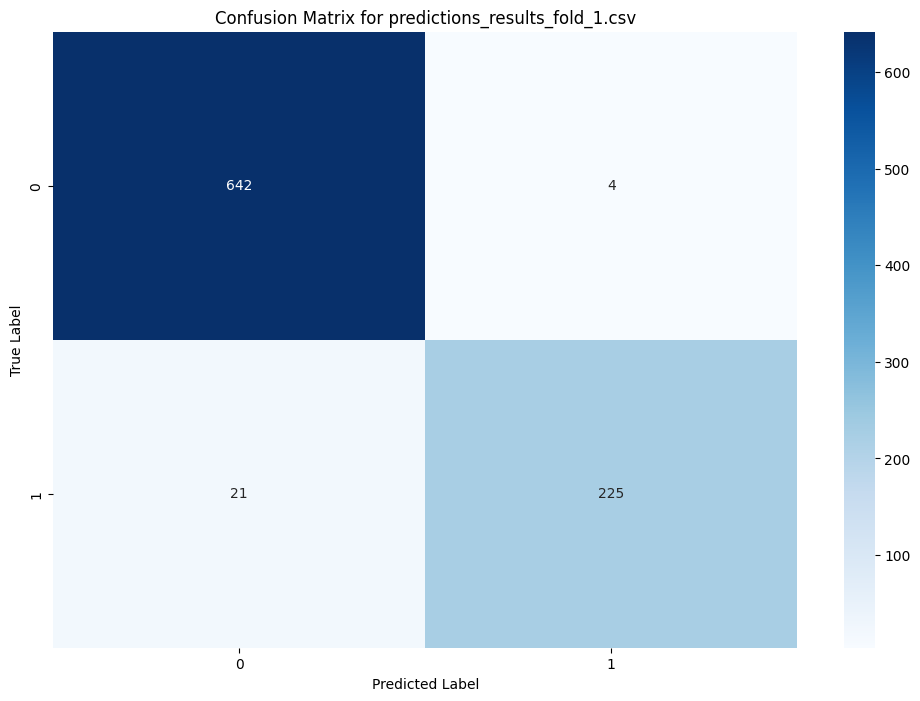


--- Results from predictions_results_fold_2.csv ---

                                          Image_Path  True_Label  \
0  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
1  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
2  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
3  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
4  /content/drive/MyDrive/no_bg/test_no_bg/0/032_...           0   

   Predicted_Label  
0                0  
1                0  
2                0  
3                0  
4                0  

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       646
           1       0.94      0.96      0.95       246

    accuracy                           0.97       892
   macro avg       0.96      0.97      0.96       892
weighted avg       0.97      0.97      0.97       892



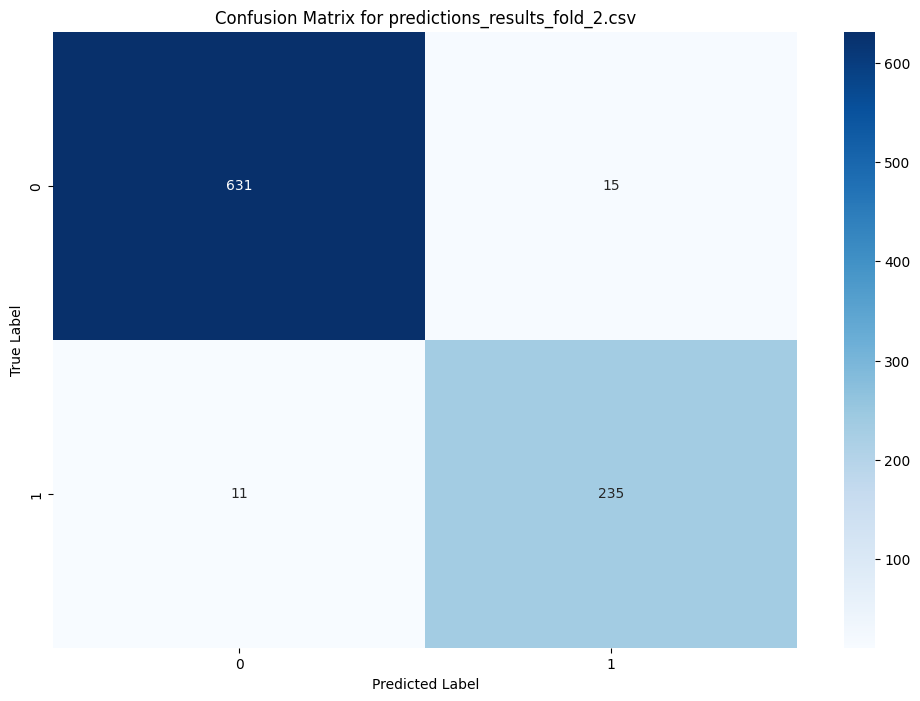


--- Results from predictions_results_fold_3.csv ---

                                          Image_Path  True_Label  \
0  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
1  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
2  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
3  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
4  /content/drive/MyDrive/no_bg/test_no_bg/0/032_...           0   

   Predicted_Label  
0                0  
1                0  
2                0  
3                0  
4                0  

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       646
           1       0.97      0.93      0.95       246

    accuracy                           0.97       892
   macro avg       0.97      0.96      0.97       892
weighted avg       0.97      0.97      0.97       892



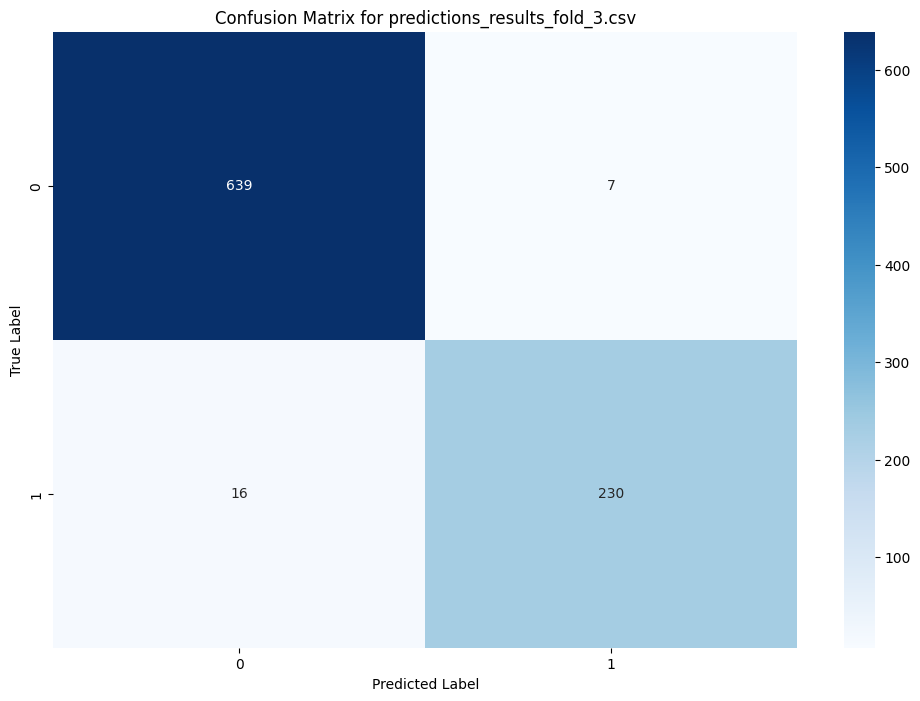


--- Results from predictions_results_fold_4.csv ---

                                          Image_Path  True_Label  \
0  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
1  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
2  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
3  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
4  /content/drive/MyDrive/no_bg/test_no_bg/0/032_...           0   

   Predicted_Label  
0                0  
1                0  
2                0  
3                0  
4                0  

Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       646
           1       0.99      0.86      0.92       246

    accuracy                           0.96       892
   macro avg       0.97      0.93      0.94       892
weighted avg       0.96      0.96      0.96       892



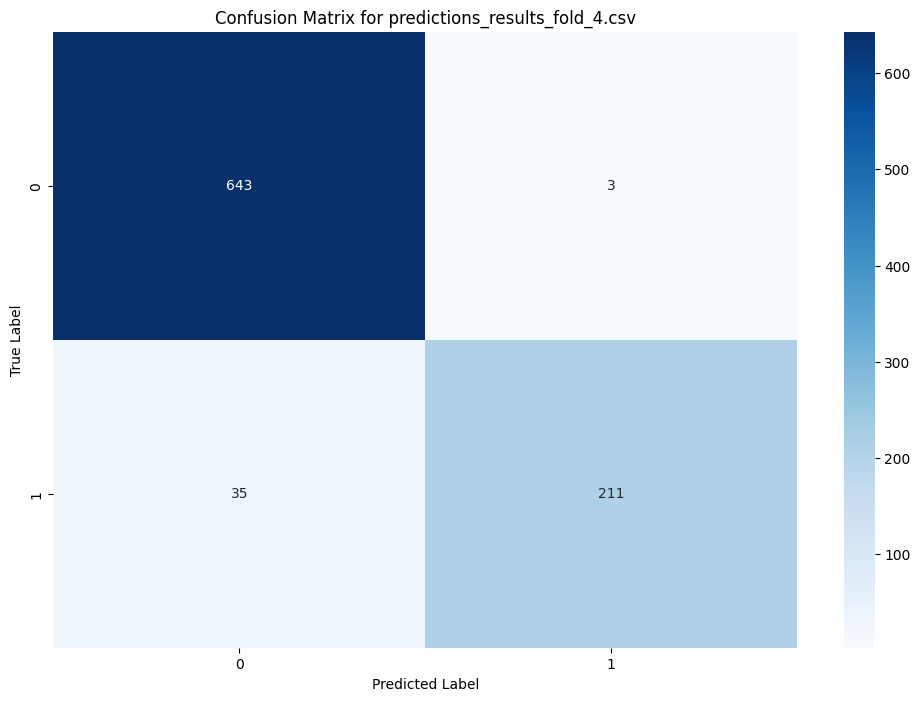


--- Results from predictions_results_fold_5.csv ---

                                          Image_Path  True_Label  \
0  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
1  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
2  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
3  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...           0   
4  /content/drive/MyDrive/no_bg/test_no_bg/0/032_...           0   

   Predicted_Label  
0                0  
1                0  
2                0  
3                0  
4                0  

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       646
           1       0.98      0.93      0.95       246

    accuracy                           0.98       892
   macro avg       0.98      0.96      0.97       892
weighted avg       0.98      0.98      0.98       892



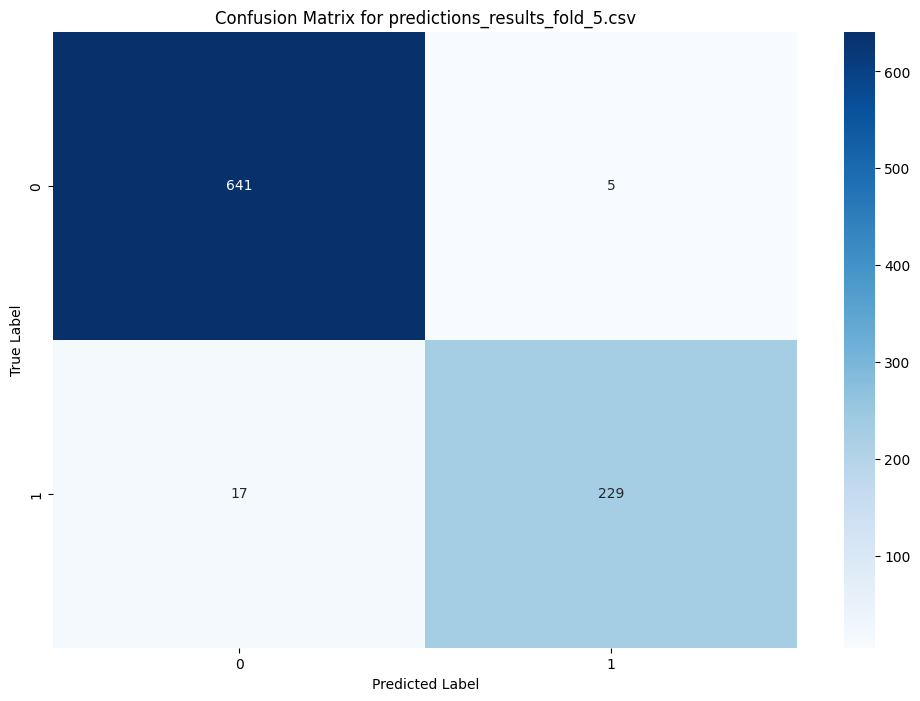

In [8]:
import pandas as pd
import os
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Пути к сохраненным результатам
output_files = [f"predictions_results_fold_{fold}.csv" for fold in range(1, 6)]

# Перебираем сохраненные файлы и выводим результаты
for file in output_files:
    if os.path.exists(file):
        print(f"\n--- Results from {file} ---\n")

        # Чтение файла
        df_results = pd.read_csv(file)
        print(df_results.head())  # Вывод первых строк DataFrame

        # Получение истинных и предсказанных значений
        true_labels = df_results['True_Label']
        predicted_labels = df_results['Predicted_Label']

        # Уникальные классы
        unique_classes = sorted(true_labels.unique())
        unique_classes_str = [str(cls) for cls in unique_classes]  # Преобразуем метки в строки

        # Вывод метрик
        print("\nClassification Report:")
        print(classification_report(true_labels, predicted_labels, target_names=unique_classes_str))

        # Создание матрицы ошибок
        conf_matrix = confusion_matrix(true_labels, predicted_labels, labels=unique_classes)

        # Визуализация матрицы ошибок
        plt.figure(figsize=(12, 8))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_classes_str, yticklabels=unique_classes_str)
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title(f'Confusion Matrix for {file}')
        plt.show()
    else:
        print(f"File {file} does not exist.")


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
<ipython-input-12-f410614b3b70>:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_glob

True_Label: 0, Predicted_Label: 1


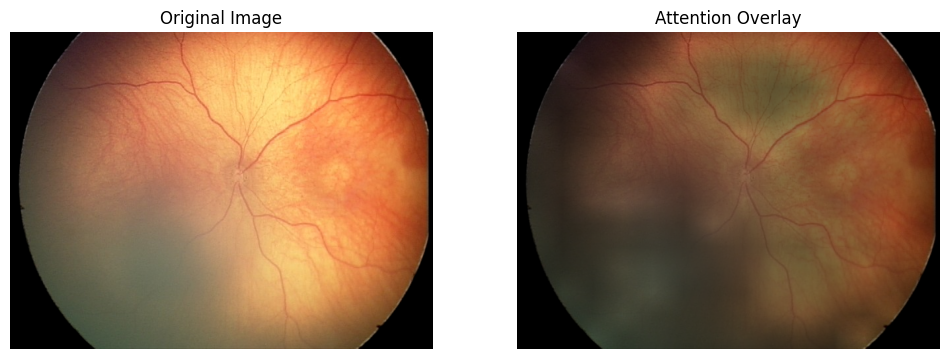

True_Label: 0, Predicted_Label: 1


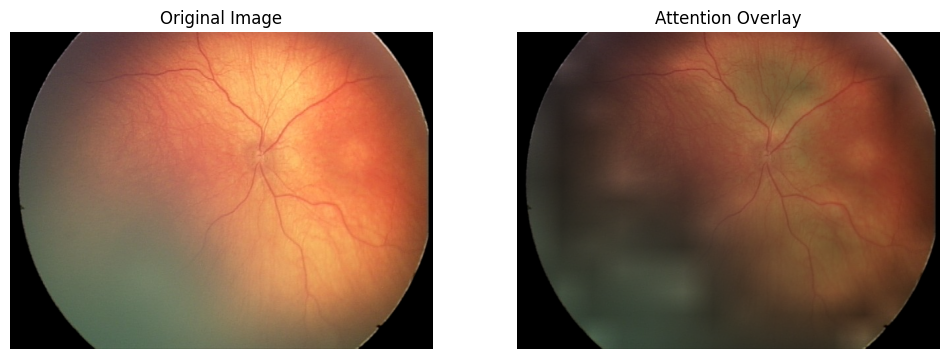

True_Label: 0, Predicted_Label: 1


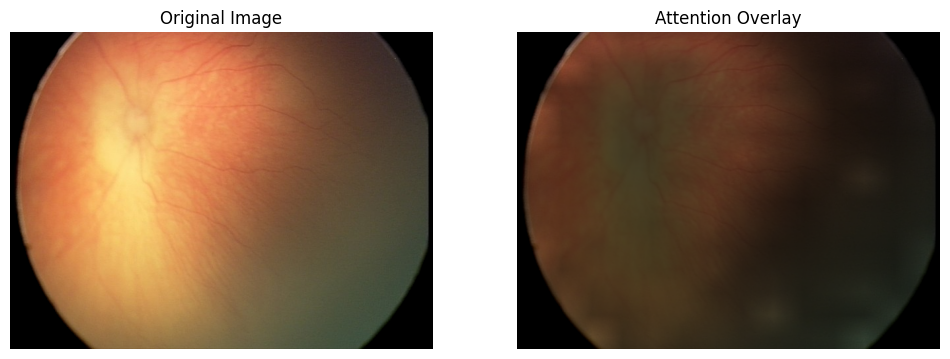

True_Label: 0, Predicted_Label: 1


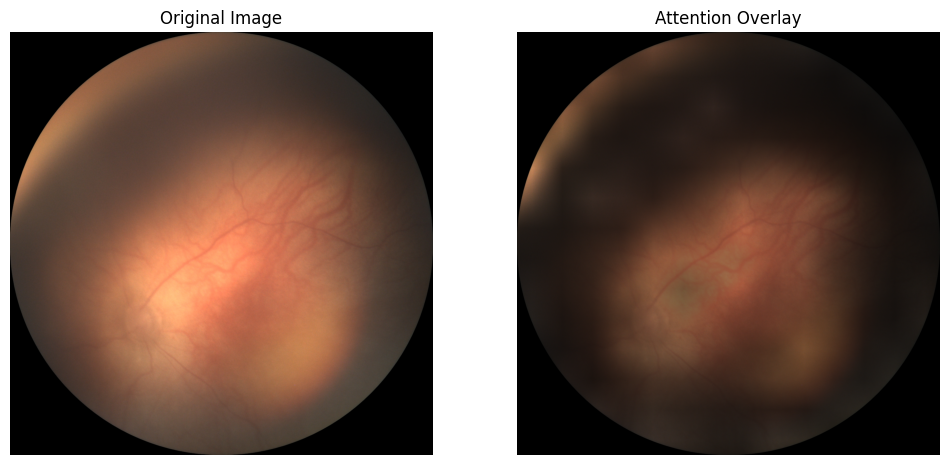

True_Label: 0, Predicted_Label: 1


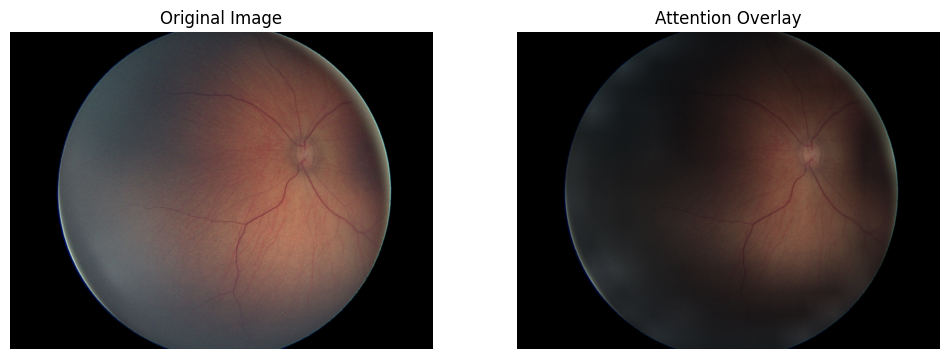

True_Label: 0, Predicted_Label: 1


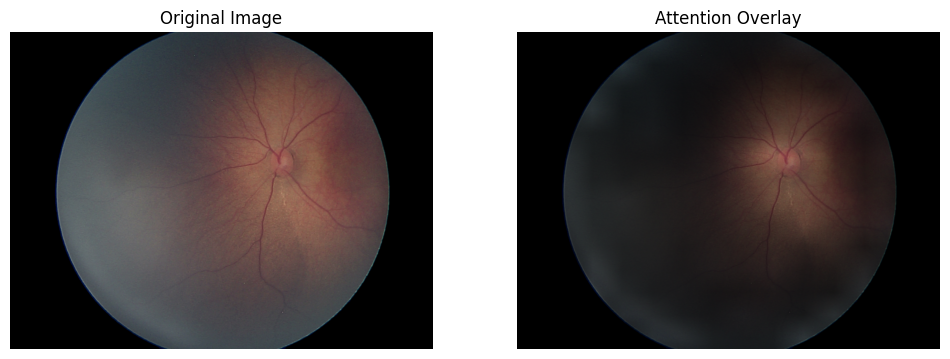

True_Label: 0, Predicted_Label: 1


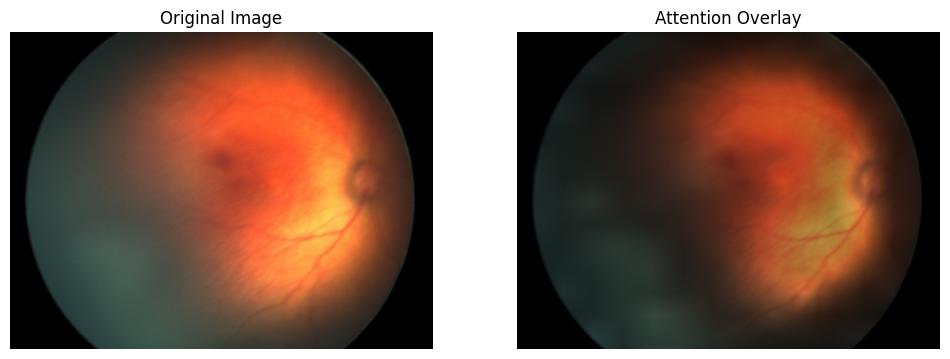

True_Label: 1, Predicted_Label: 0


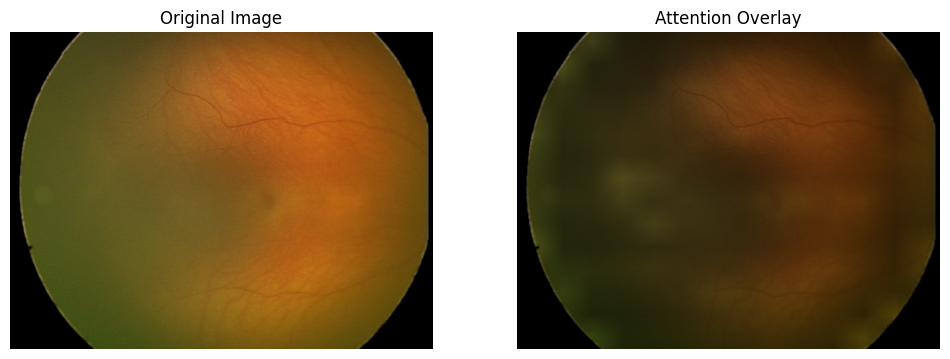

True_Label: 1, Predicted_Label: 0


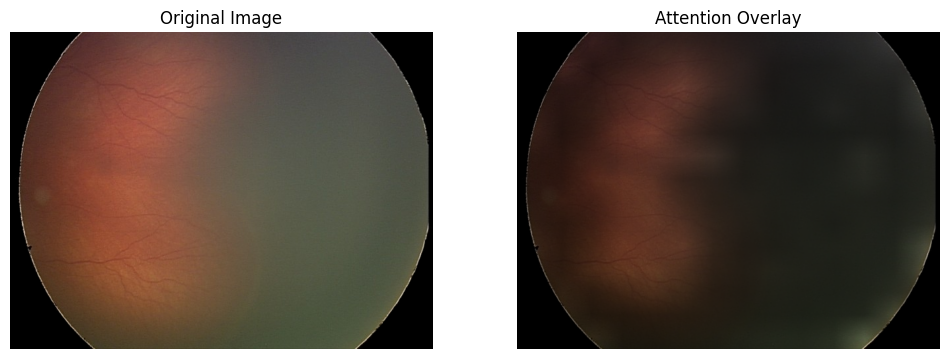

True_Label: 1, Predicted_Label: 0


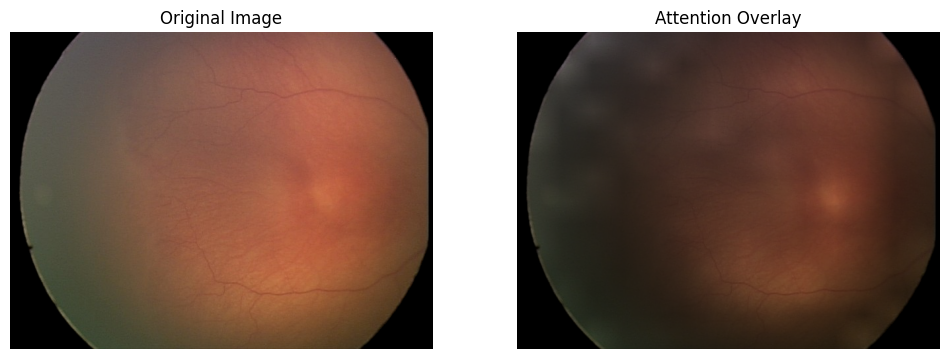

True_Label: 1, Predicted_Label: 0


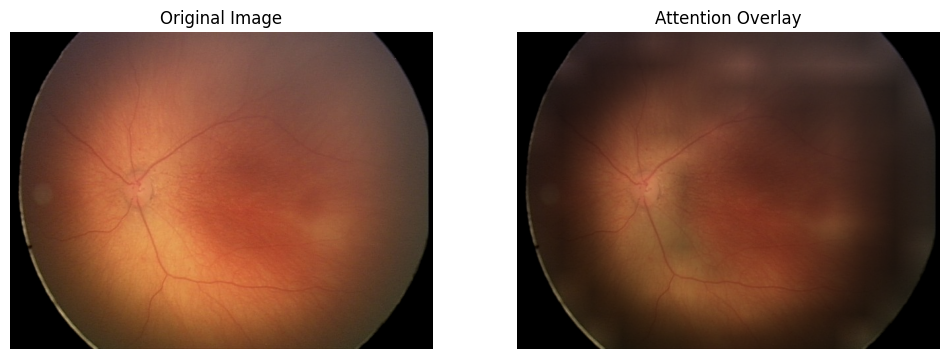

True_Label: 1, Predicted_Label: 0


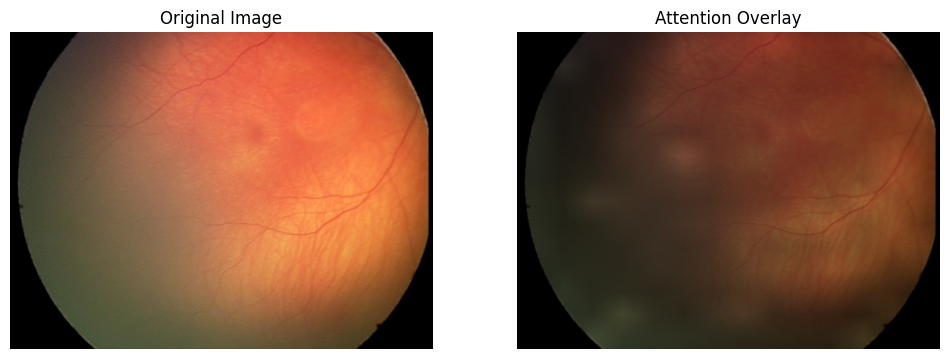

True_Label: 1, Predicted_Label: 0


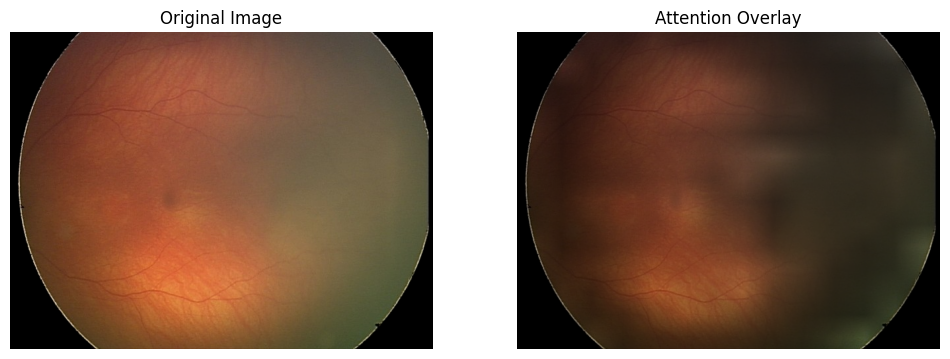

True_Label: 1, Predicted_Label: 0


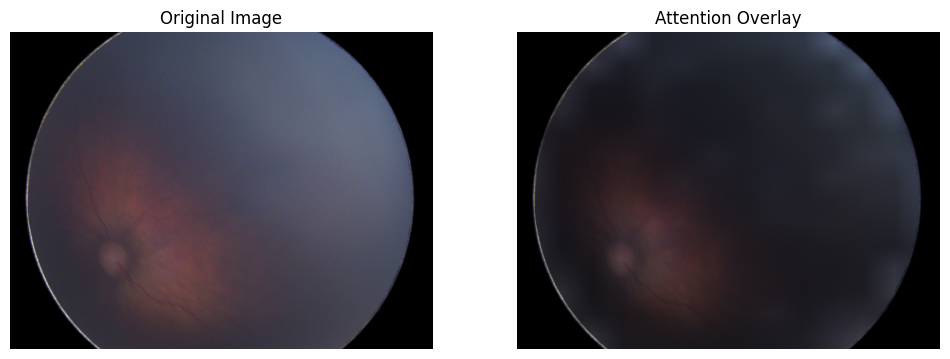

True_Label: 1, Predicted_Label: 0


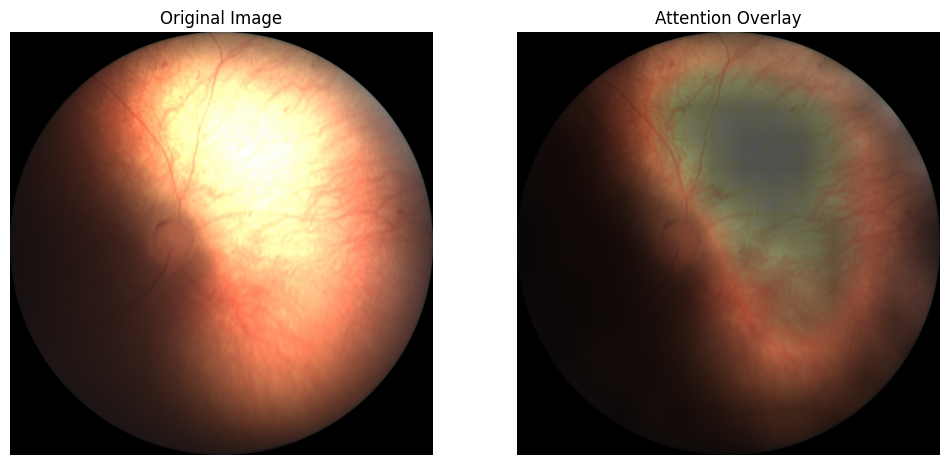

True_Label: 1, Predicted_Label: 0


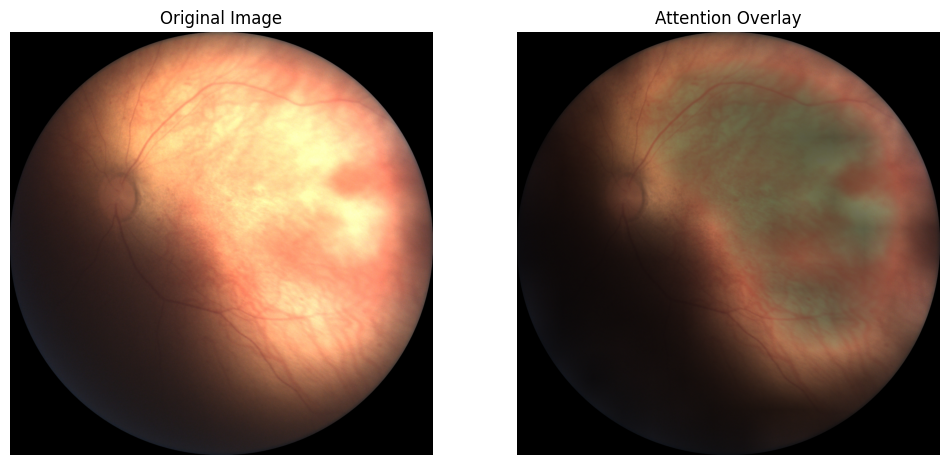

True_Label: 1, Predicted_Label: 0


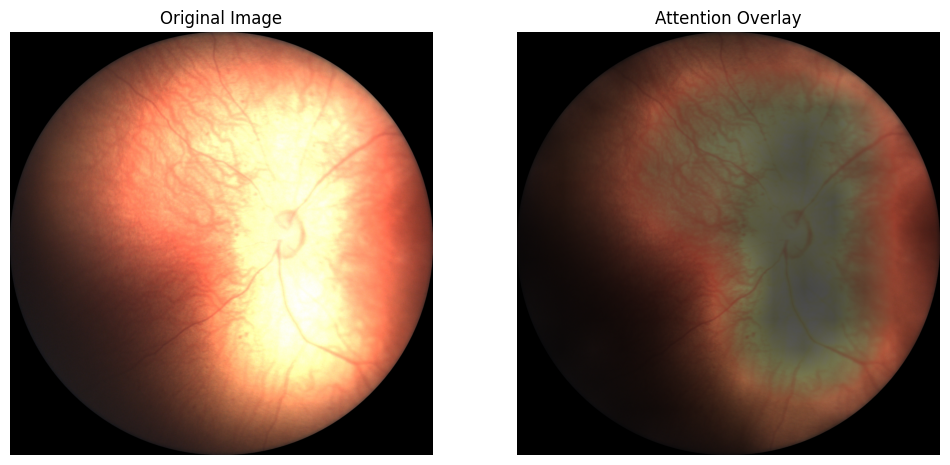

True_Label: 1, Predicted_Label: 0


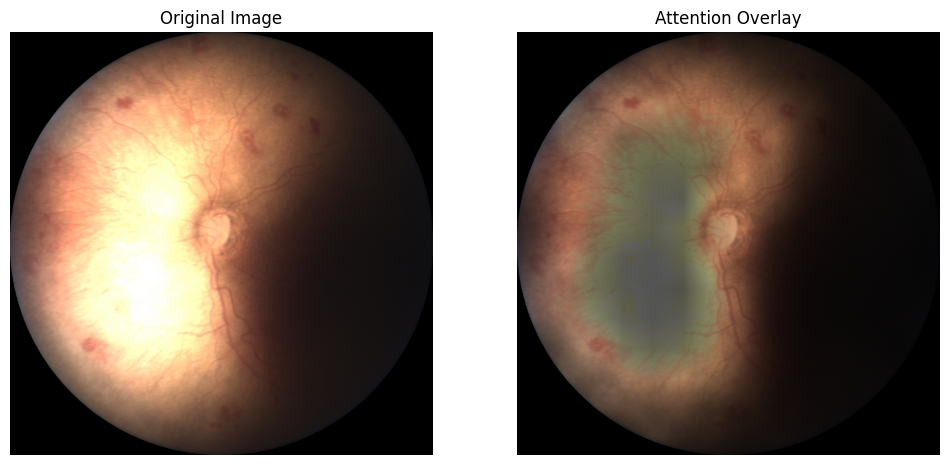

True_Label: 1, Predicted_Label: 0


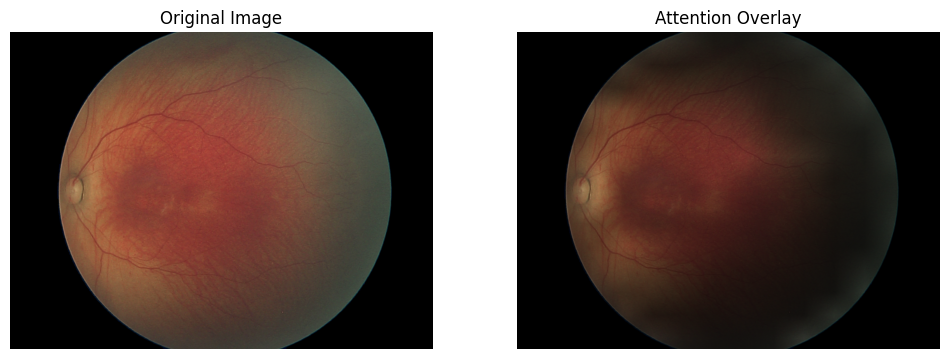

True_Label: 1, Predicted_Label: 0


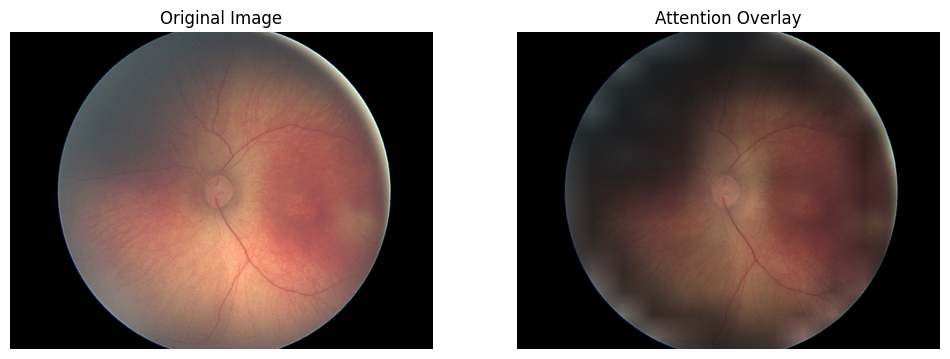

True_Label: 1, Predicted_Label: 0


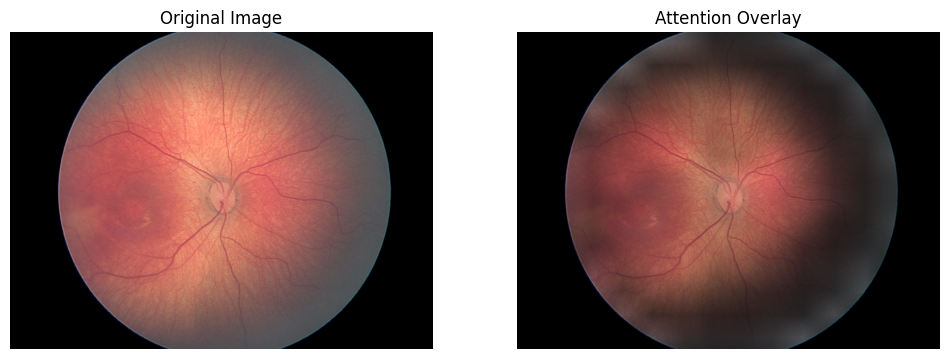

True_Label: 1, Predicted_Label: 0


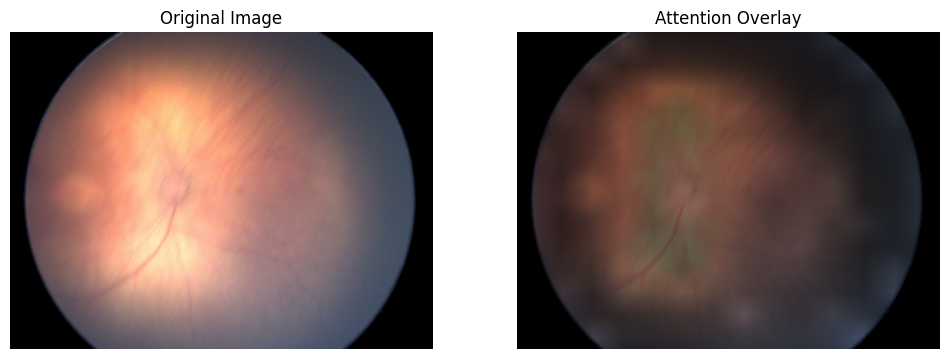

True_Label: 1, Predicted_Label: 0


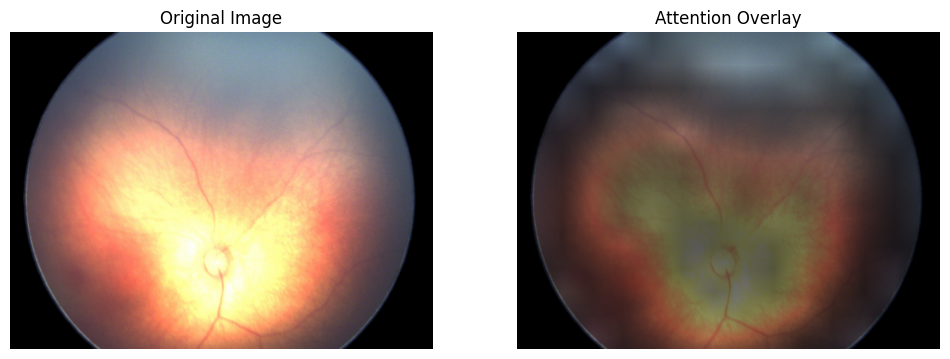

In [12]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from torchvision import transforms
from transformers import AutoModelForImageClassification  # Импорт модели ViT

# Пути к данным
MODEL_PATH = '/content/saved_models/model_fold_3.pth'
RESULTS_PATH = '/content/predictions_results_fold_3.csv'

# Устройство
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Трансформации для тестового изображения
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Загрузка модели
def load_model(model_path):
    """
    Загружает модель из указанного пути.
    """
    model = AutoModelForImageClassification.from_pretrained(
        'google/vit-base-patch16-224-in21k',  # Архитектура модели
        output_attentions=True
    )
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    return model

model = load_model(MODEL_PATH)

# Загрузка результатов
df_results = pd.read_csv(RESULTS_PATH)

# Функция для построения наложений внимания
def get_attention_image(image_path, model):
    """
    Получение изображения с наложенной матрицей внимания.

    Параметры:
    - image_path: Путь к изображению.
    - model: Предобученная модель с поддержкой внимания.

    Возвращает:
    - attention_overlay: Изображение с наложенной матрицей внимания.
    - original_image: Оригинальное изображение (PIL).
    """
    # Открытие и подготовка изображения
    image = Image.open(image_path).convert("RGB")
    transformed_image = test_transform(image).unsqueeze(0).to(DEVICE)

    # Перевод модели в режим оценки и получение внимания
    model.eval()
    with torch.no_grad():
        outputs = model(pixel_values=transformed_image, output_attentions=True)
        logits = outputs.logits
        att_mat = outputs.attentions

    # Преобразование списка или кортежа в тензор
    if isinstance(att_mat, (tuple, list)):
        att_mat = torch.stack(att_mat).squeeze(1)
    else:
        att_mat = att_mat.squeeze(1)

    # Усреднение матрицы внимания
    att_mat = torch.mean(att_mat, dim=1)

    # Добавление остаточного внимания
    residual_att = torch.eye(att_mat.size(1)).to(DEVICE)
    aug_att_mat = att_mat + residual_att
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

    # Итоговая матрица внимания
    joint_attentions = torch.zeros(aug_att_mat.size()).to(DEVICE)
    joint_attentions[0] = aug_att_mat[0]

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n - 1])

    # Финальная матрица внимания
    v = joint_attentions[-1]
    grid_size = int(np.sqrt(v.size(-1)))
    mask = v[0, 1:].reshape(grid_size, grid_size).cpu().detach().numpy()

    # Преобразование маски к размеру изображения
    mask = cv2.resize(mask / mask.max(), image.size)[..., np.newaxis]
    overlay = (mask * np.array(image)).astype("uint8")

    return overlay, image

# Анализ ошибок
errors = df_results[df_results['True_Label'] != df_results['Predicted_Label']]

for _, row in errors.iterrows():
    image_path = row['Image_Path']
    true_label = row['True_Label']
    predicted_label = row['Predicted_Label']

    print(f"True_Label: {true_label}, Predicted_Label: {predicted_label}")

    attention_overlay, original_image = get_attention_image(image_path, model)

    # Отображение
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.imshow(original_image)
    ax1.set_title("Original Image")
    ax1.axis("off")

    ax2.imshow(attention_overlay)
    ax2.set_title("Attention Overlay")
    ax2.axis("off")

    plt.show()


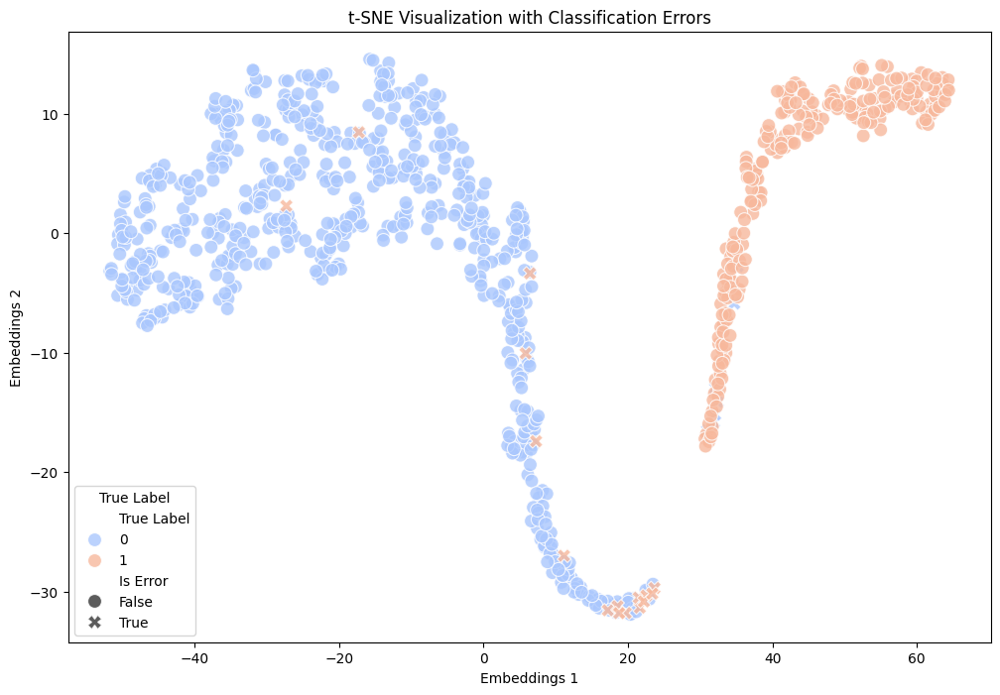

In [15]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns

def extract_embeddings_with_predictions(model, dataloader, device):
    """
    Извлечение эмбеддингов из модели вместе с метками истинных и предсказанных классов.

    Параметры:
    - model: Обученная модель.
    - dataloader: DataLoader с тестовыми данными.
    - device: Устройство ('cuda' или 'cpu').

    Возвращает:
    - embeddings: Эмбеддинги для каждого изображения.
    - true_labels: Истинные метки классов.
    - predicted_labels: Предсказанные метки классов.
    """
    model.eval()
    embeddings = []
    true_labels = []
    predicted_labels = []

    with torch.no_grad():
        for inputs, labels, _ in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(pixel_values=inputs, output_attentions=False)
            logits = outputs.logits
            embedding = logits  # Используем логиты как эмбеддинги

            embeddings.append(embedding.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
            predicted_labels.extend(torch.argmax(logits, dim=1).cpu().numpy())

    embeddings = np.concatenate(embeddings, axis=0)
    return embeddings, true_labels, predicted_labels

def plot_embeddings_with_errors(embeddings, true_labels, predicted_labels, method="t-SNE"):
    """
    Визуализация эмбеддингов с указанием ошибок классификации.

    Параметры:
    - embeddings: Эмбеддинги изображений.
    - true_labels: Истинные метки классов.
    - predicted_labels: Предсказанные метки классов.
    - method: Метод снижения размерности ('t-SNE' или 'PCA').
    """
    # Уменьшение размерности
    if method == "t-SNE":
        reducer = TSNE(n_components=2, random_state=42)
    elif method == "PCA":
        reducer = PCA(n_components=2)
    reduced_embeddings = reducer.fit_transform(embeddings)

    # Определение ошибок
    errors = np.array(true_labels) != np.array(predicted_labels)

    # Создание DataFrame
    vis_df = pd.DataFrame({
        'Embeddings 1': reduced_embeddings[:, 0],
        'Embeddings 2': reduced_embeddings[:, 1],
        'True Label': true_labels,
        'Predicted Label': predicted_labels,
        'Is Error': errors
    })

    # Визуализация
    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        data=vis_df,
        x='Embeddings 1', y='Embeddings 2',
        hue='True Label',
        style='Is Error',  # Ошибки выделены стилем
        palette='coolwarm',
        alpha=0.8,
        s=100
    )
    plt.title(f"{method} Visualization with Classification Errors")
    plt.legend(title='True Label')
    plt.show()

# Пример использования:
embeddings, true_labels, predicted_labels = extract_embeddings_with_predictions(model, test_loader, DEVICE)
plot_embeddings_with_errors(embeddings, true_labels, predicted_labels, method="t-SNE")
